In [52]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, confusion_matrix

In [53]:
df = pd.read_csv('voice.csv')

In [54]:
df.shape

(3168, 21)

In [55]:
df.label.value_counts()

male      1584
female    1584
Name: label, dtype: int64

In [56]:
le = LabelEncoder()
df["label"] = le.fit_transform(df["label"])

In [57]:
df.head()

,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,...,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx,label
0,0.059781,0.064241,0.032027,0.015071,0.090193,0.075122,12.863462,274.402906,0.893369,0.491918,...,0.059781,0.084279,0.015702,0.275862,0.007812,0.007812,0.007812,0.000000,0.000000,1
1,0.066009,0.067310,0.040229,0.019414,0.092666,0.073252,22.423285,634.613855,0.892193,0.513724,...,0.066009,0.107937,0.015826,0.250000,0.009014,0.007812,0.054688,0.046875,0.052632,1
2,0.077316,0.083829,0.036718,0.008701,0.131908,0.123207,30.757155,1024.927705,0.846389,0.478905,...,0.077316,0.098706,0.015656,0.271186,0.007990,0.007812,0.015625,0.007812,0.046512,1
3,0.151228,0.072111,0.158011,0.096582,0.207955,0.111374,1.232831,4.177296,0.963322,0.727232,...,0.151228,0.088965,0.017798,0.250000,0.201497,0.007812,0.562500,0.554688,0.247119,1
4,0.135120,0.079146,0.124656,0.078720,0.206045,0.127325,1.101174,4.333713,0.971955,0.783568,...,0.135120,0.106398,0.016931,0.266667,0.712812,0.007812,5.484375,5.476562,0.208274,1


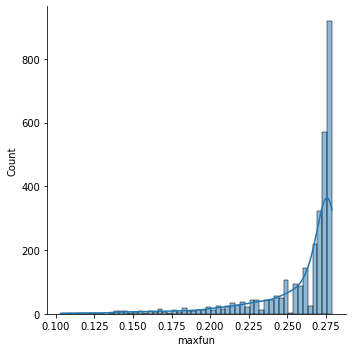

In [58]:
sns.displot(data=df, x="maxfun", kde=True)

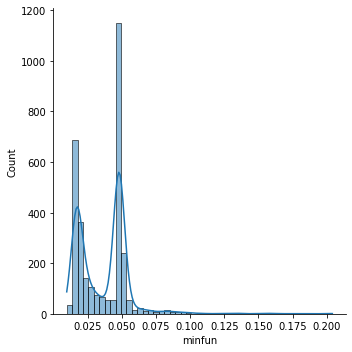

In [59]:
sns.displot(data=df, x="minfun", kde=True)

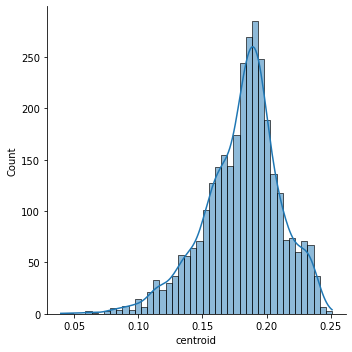

In [60]:
sns.displot(data=df, x="centroid", kde=True)

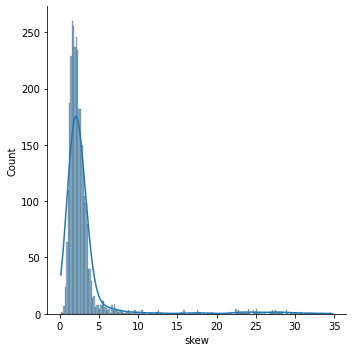

In [61]:
sns.displot(data=df, x="skew", kde=True)

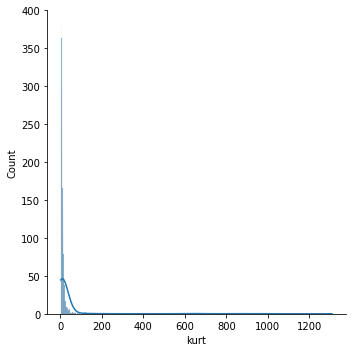

In [62]:
sns.displot(data=df, x="kurt", kde=True)

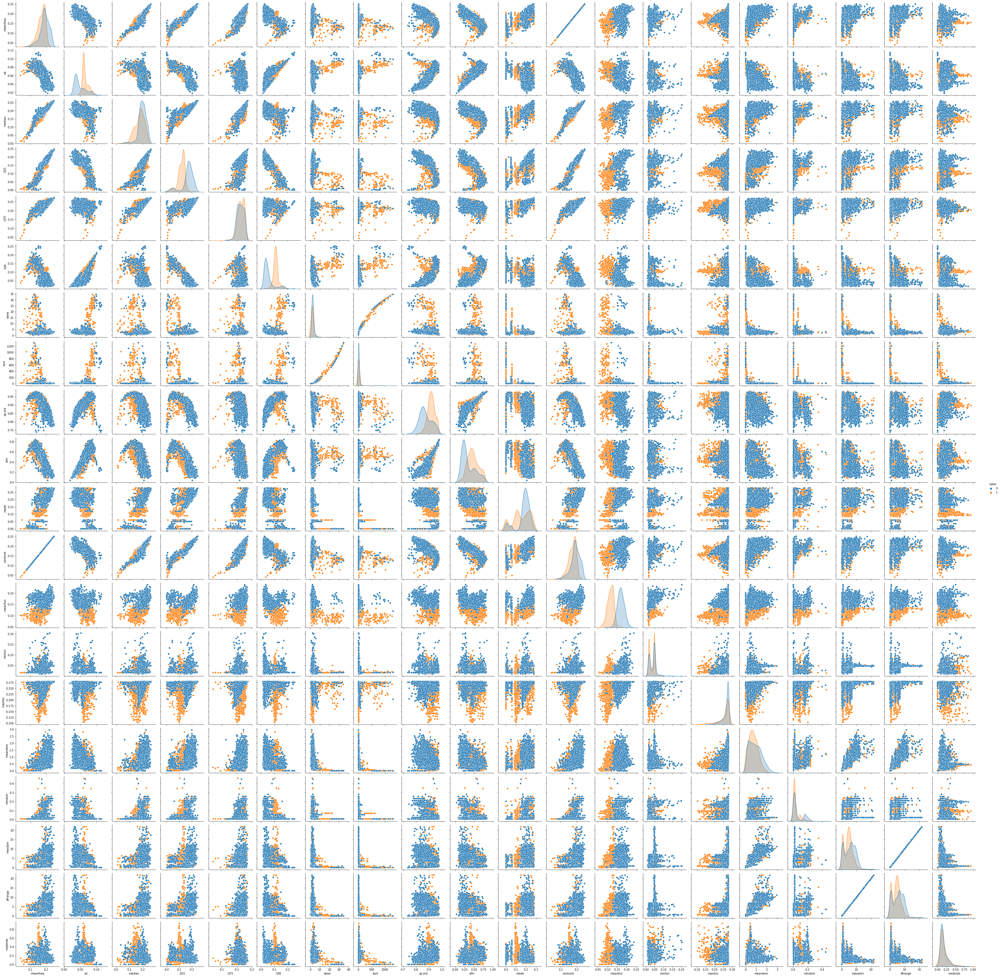

In [63]:
sns.pairplot(df, hue = "label")

In [64]:
x = df.drop(['label'], axis=1)
y = df['label']

In [66]:
from sklearn.preprocessing import StandardScaler

In [70]:
scalar = StandardScaler()
scalar.fit(x)
x = scalar.transform(x)

In [71]:
xtrain, xtest, ytrain, ytest = train_test_split(x,y, test_size=0.2)

In [72]:
model = SVC(kernel='rbf')
model.fit(xtrain,ytrain)

SVC()

In [73]:
ypred = model.predict(xtest)
accuracy_score(ytest, ypred)

0.9810725552050473

In [74]:
from sklearn.metrics import classification_report

In [75]:
print(classification_report(ytest,ypred))

              precision    recall  f1-score   support

           0       0.97      0.99      0.98       306
           1       0.99      0.98      0.98       328

    accuracy                           0.98       634
   macro avg       0.98      0.98      0.98       634
weighted avg       0.98      0.98      0.98       634



In [82]:
from xgboost import XGBClassifier

In [83]:
model1 = XGBClassifier()
model1.fit(xtrain,ytrain)

/home/leeladhar/.local/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[15:17:21] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              gamma=0, gpu_id=-1, importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=100, n_jobs=8,
              num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [84]:
ypred = model1.predict(xtest)
accuracy_score(ytest, ypred)

0.9700315457413249